In [5]:
from __future__ import print_function
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from torchviz import make_dot
import pdb

class G(nn.Module):
    def __init__(self, input_size, output_size, hidden_size=10, t_sample=1):
        super(G, self).__init__()
        self.g1 = nn.Linear(input_size * t_sample, hidden_size, bias=True)
        self.g2 = nn.Linear(hidden_size, output_size * t_sample, bias=True)
        self.act = nn.Tanh()

    def forward(self, x):
        x = F.relu(self.g1(x))
        x = self.g2(x)
        x = self.act(x)
        return x
    
class Unit(nn.Module):
    def __init__(self, name, layer_index, mu_size, mu_next_size, t_sample, device):
        super(Unit, self).__init__()
        self.device = device
        self.name = name
        self.t_sample = t_sample

        self.g = G(input_size=mu_next_size, output_size=mu_size, t_sample=t_sample)
        self.f = G(input_size=mu_size, output_size=mu_size, t_sample=t_sample)
        self.loss_g = 0
        self.loss_f = 0

        lr = 0.2
        self.optimizer_g = optim.SGD(self.g.parameters(), lr=(lr), momentum=0)
        self.optimizer_f = optim.SGD(self.f.parameters(), lr=lr, momentum=0)

        # this unit's state
        self.previous_mu = torch.zeros([mu_size * t_sample], requires_grad=True).to(device)
        self.mu = torch.zeros([mu_size * t_sample], requires_grad=True).to(device)
        self.mu_bar = torch.zeros([mu_size * t_sample], requires_grad=True).to(device)
        self.mu_hat = torch.zeros([mu_size * t_sample], requires_grad=True).to(device)

        # next unit's mu
        self.mu_next = torch.zeros([mu_next_size * t_sample], requires_grad=True).to(device)

        # buffers for temporal pooling
        self.temporal_pooling_size = 2 ** layer_index
        self.reset_buffers()

    def pool(self, buffer):
        x = np.reshape(np.array([b.detach().numpy() for b in buffer]), (1, 1, self.t_sample * self.temporal_pooling_size))
        x = torch.nn.functional.avg_pool1d(torch.tensor(x), kernel_size=self.temporal_pooling_size)
        return x.reshape(self.t_sample)

    def reset_buffers(self):
        self.buffer_previous_mu = []
        self.buffer_mu = []
        self.buffer_mu_bar = [] 
        self.buffer_mu_hat = [] 
        self.buffer_mu_next = []

    def set_mu(self, mu):
        self.mu = mu
        
    def set_mu_next(self, mu_next):
        self.mu_next = mu_next

    def before_step(self):
        pass

    def compute_predictions(self):
        self.buffer_previous_mu.append(self.previous_mu)
        self.buffer_mu.append(self.mu)
        self.buffer_mu_next.append(self.mu_next)

        if len(self.buffer_mu) == self.temporal_pooling_size:
            self.mu_bar = self.f(self.pool(self.buffer_previous_mu))
            self.mu_hat = self.g(self.pool(self.buffer_mu_next))

    def train(self):
        # add to buffers
        self.buffer_mu_bar.append(self.mu_bar)
        self.buffer_mu_hat.append(self.mu_hat)

        if len(self.buffer_mu) == self.temporal_pooling_size:
            if self.temporal_pooling_size == 1:
                pooled_previous_mu = self.previous_mu
                pooled_mu = self.mu
                pooled_mu_bar = self.mu_bar
                pooled_mu_hat = self.mu_hat
                pooled_mu_next = self.mu_next
            else:
                pooled_previous_mu = self.pool(self.buffer_previous_mu)
                pooled_mu = self.pool(self.buffer_mu)
                pooled_mu_bar = self.pool(self.buffer_mu_bar)
                pooled_mu_hat = self.pool(self.buffer_mu_hat)
                pooled_mu_next = self.pool(self.buffer_mu_next)
                
            self.reset_buffers()

            self.g.train()
            self.optimizer_g.zero_grad()
            self.mu_hat = self.g(pooled_mu_next)
            self.loss_g = F.mse_loss(self.mu_hat, pooled_mu - pooled_mu_bar)
            self.loss_g.backward()
            self.optimizer_g.step()

            self.f.train()
            self.optimizer_f.zero_grad()
            self.mu_bar = self.f(pooled_previous_mu)
            self.loss_f = F.mse_loss(self.mu_bar, pooled_mu)
            self.loss_f.backward()
            self.optimizer_f.step()


        self.previous_mu = self.mu

    def history(self):
        return [self.loss_g, self.loss_f, self.mu_bar[-1], self.mu_hat[-1], self.mu[-1], self.mu_bar[-1] + self.mu_hat[-1]]


class UnitStack(nn.Module):
    def __init__(self, units):
        super(UnitStack, self).__init__()
        self.units = units
        self.unit_count = len(units)

    def step(self, mu, mu_awareness, train=True):
        # before step initialization
        [self.units[layer].before_step() for layer in range(self.unit_count)]
        
        # forward error propagation
        self.units[0].set_mu(mu)
        self.units[-1].set_mu_next(mu_awareness)

        for layer in range(1, self.unit_count):
            # compute mu using previous layer's predictions
            # mu is part of the signal the previous layer could not predict
            self.units[layer].set_mu((self.units[layer - 1].mu - (self.units[layer - 1].mu_hat + self.units[layer - 1].mu_bar)).detach())
                                                               
            self.units[layer - 1].set_mu_next(self.units[layer].mu)

        # backward flow of predictions
        [self.units[layer].compute_predictions() for layer in range(self.unit_count - 1, -1, -1)]

        # train
        if train:
            for layer in range(self.unit_count):
                self.units[layer].train()
        
        # return stats
        return [self.units[layer].history() for layer in range(self.unit_count)]
        
class SlidingWindowBuffer(object):
    def __init__(self, item_count, item_shape=(1,)):
        self.item_shape = item_shape
        self.item_count = item_count
        self.buffer = np.zeros((item_count,)).tolist()
        
    def append_item(self, item):
        # return None while gathering initial items
        if len(self.buffer) < self.item_count - 1:
            self.buffer.append(item)
            return None
        
        # once enough items, convert to np.array
        elif len(self.buffer) == self.item_count - 1:
            self.buffer.append(item)
            self.buffer = np.array(self.buffer)
            
        else:
            self.buffer = np.roll(self.buffer, -1, axis=0)
            self.buffer[-1] = item

        return self.buffer

class SampleDataPointsGenerator(object):
    def __init__(self, shape=(1,)):
        self.index = 0
        self.count = np.empty(shape).size
        
    def __next__(self):
        self.index += 1
        if self.count == 1:
            return np.sin(self.index/10.0 + np.random.random_sample() * 0.0) * np.cos(self.index/25.0) + np.random.random_sample() * 0.0
        elif self.count == 2:
            return [
                np.cos(self.index/10.0 + np.random.random_sample() * 0.2) * np.sin(self.index/5.0),
                np.sin(self.index/10.0 + np.random.random_sample() * 0.2) * np.cos(self.index/20.0)
            ]

def plot_history(loss_history, title=None):
    loss_history = np.array(loss_history)
    fig = plt.figure(figsize=(15,12))
    fig.suptitle(title, fontsize=16)
    plt.plot(loss_history[:, 0],"--",label='loss_g')
    plt.plot(loss_history[:, 1],"--",label='loss_f')
    plt.plot(loss_history[:, 2],"-",label='mu_bar',linewidth=1,alpha = 0.3)
    plt.plot(loss_history[:, 3],"-",label='mu_hat',linewidth=1,alpha = 0.3)
    plt.plot(loss_history[:, 4],"-",label='mu', linewidth=2)
    plt.plot(loss_history[:, 5],"-",label='mu_pred',linewidth=2, alpha = 0.5)

    plt.legend()
    plt.show()


In [6]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
torch.set_num_threads(12)

t_sample = 10
mu_size = 1
unit_count = 10
units = [Unit(name="unit{}".format(i), layer_index=i, mu_size=mu_size, mu_next_size=mu_size, t_sample = t_sample, device=device) for i in range(unit_count)]

network = UnitStack(units)

loss_history = []
mu_buffer = SlidingWindowBuffer(t_sample)
mu_awareness = np.ones((t_sample,))

mu_awareness = torch.tensor(mu_awareness, requires_grad=True).float().to(device)
data_generator = SampleDataPointsGenerator()

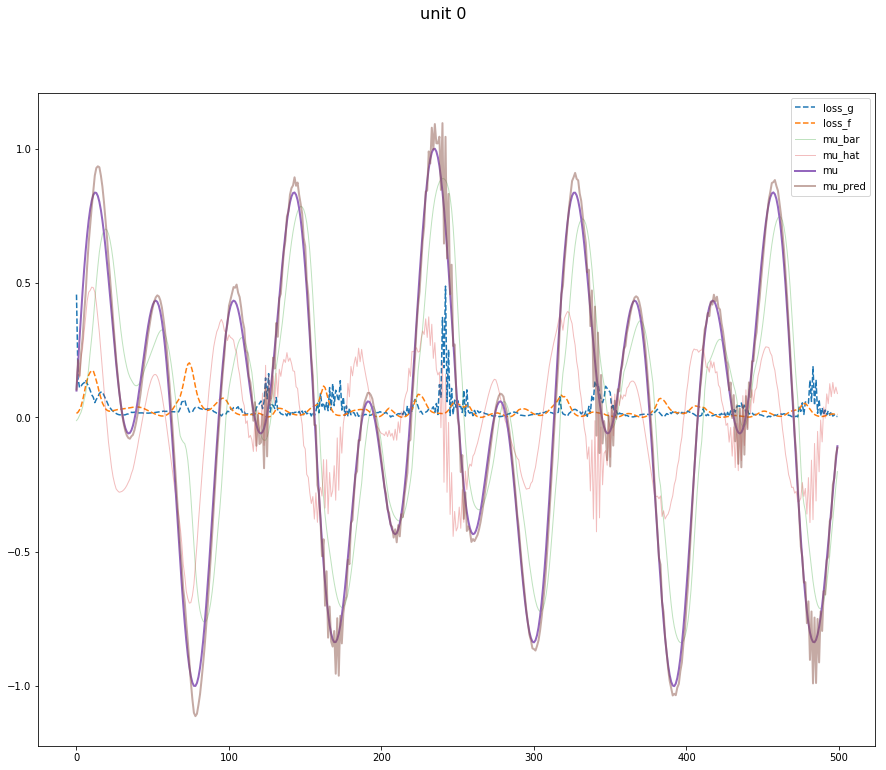

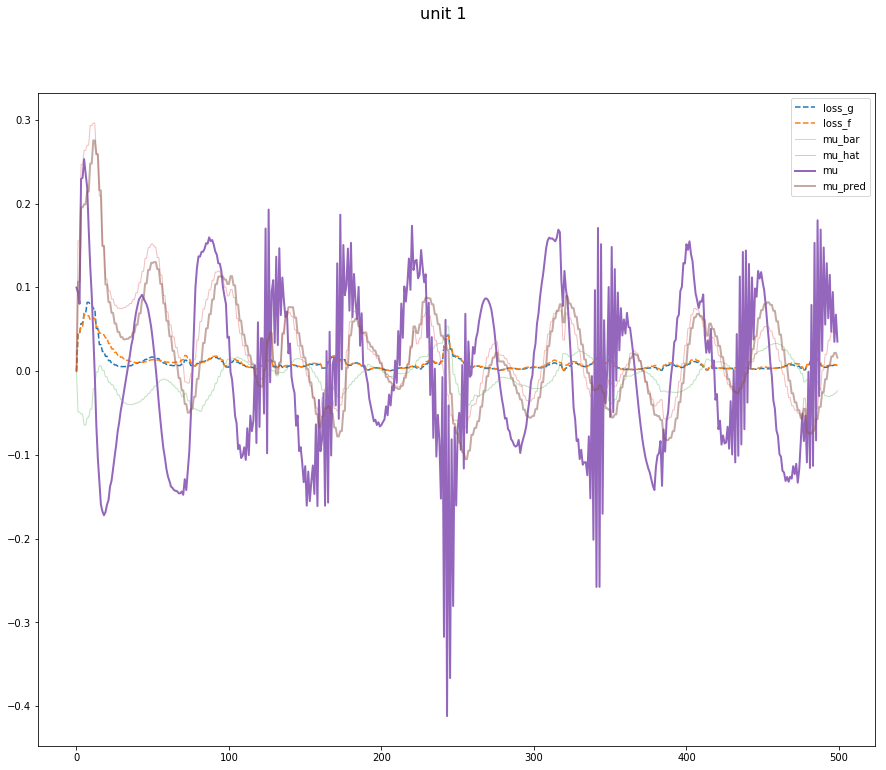

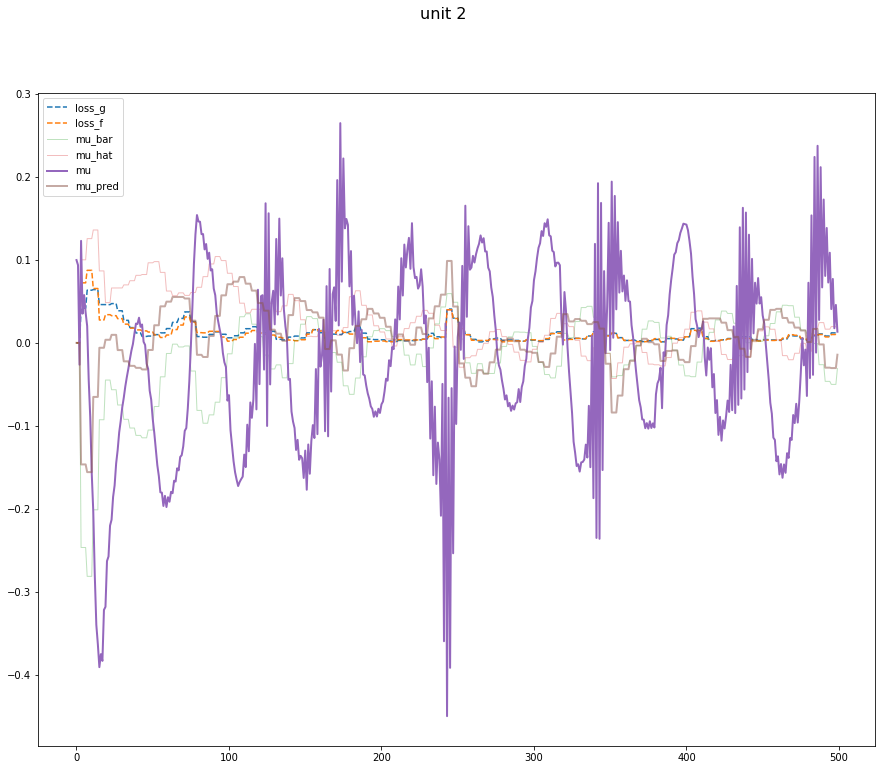

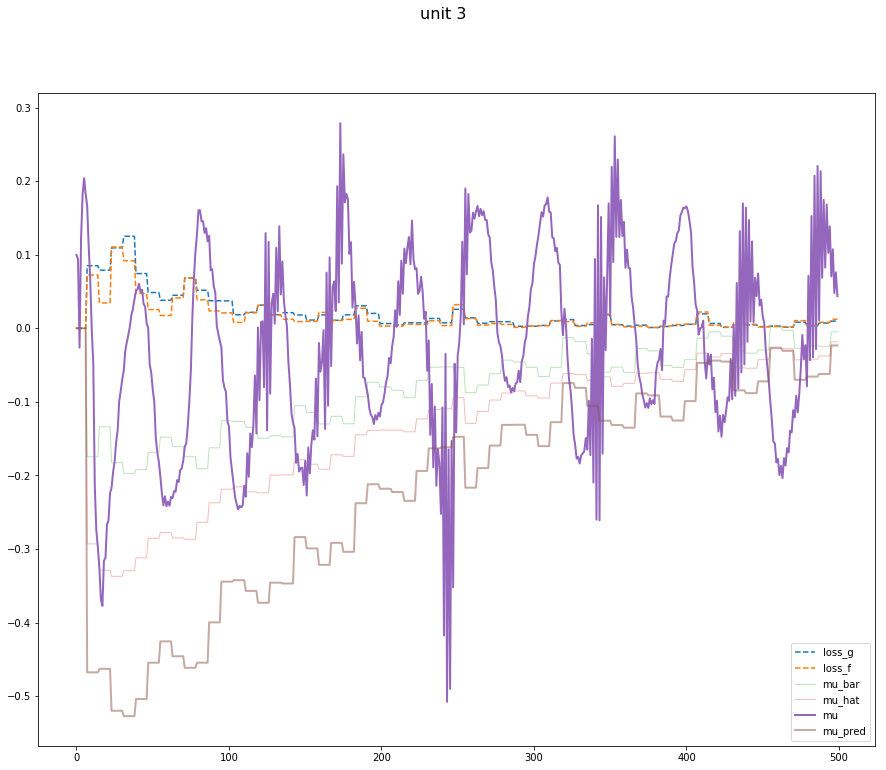

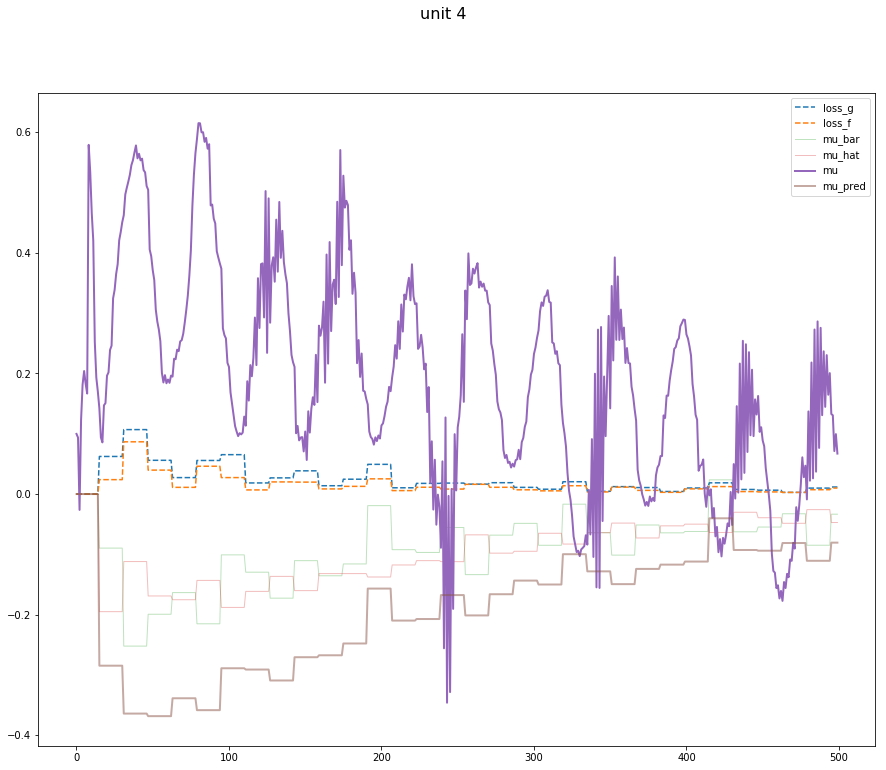

...

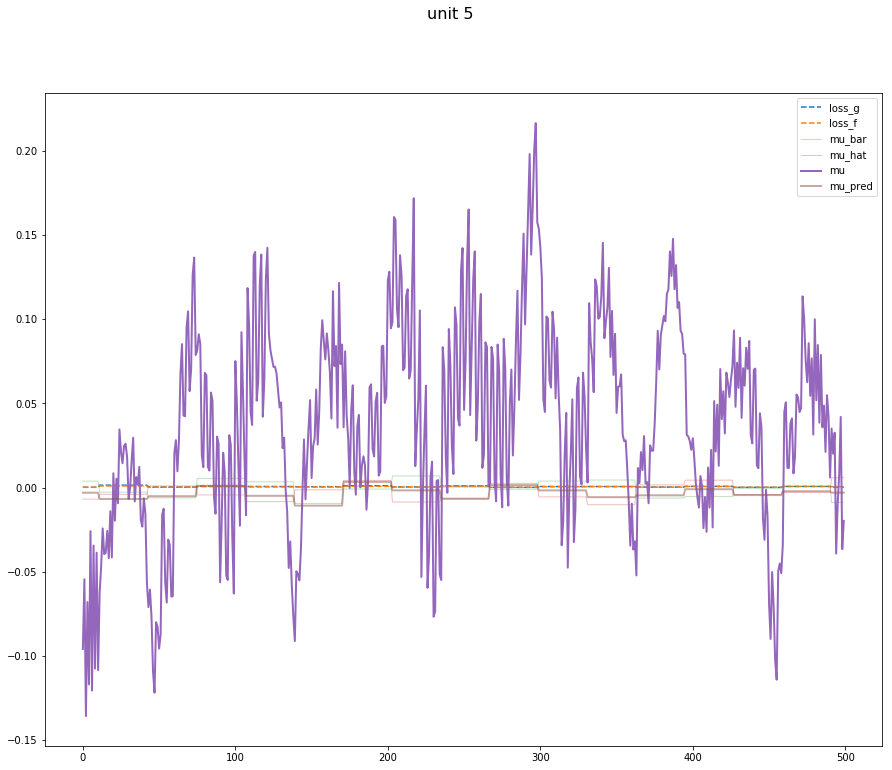

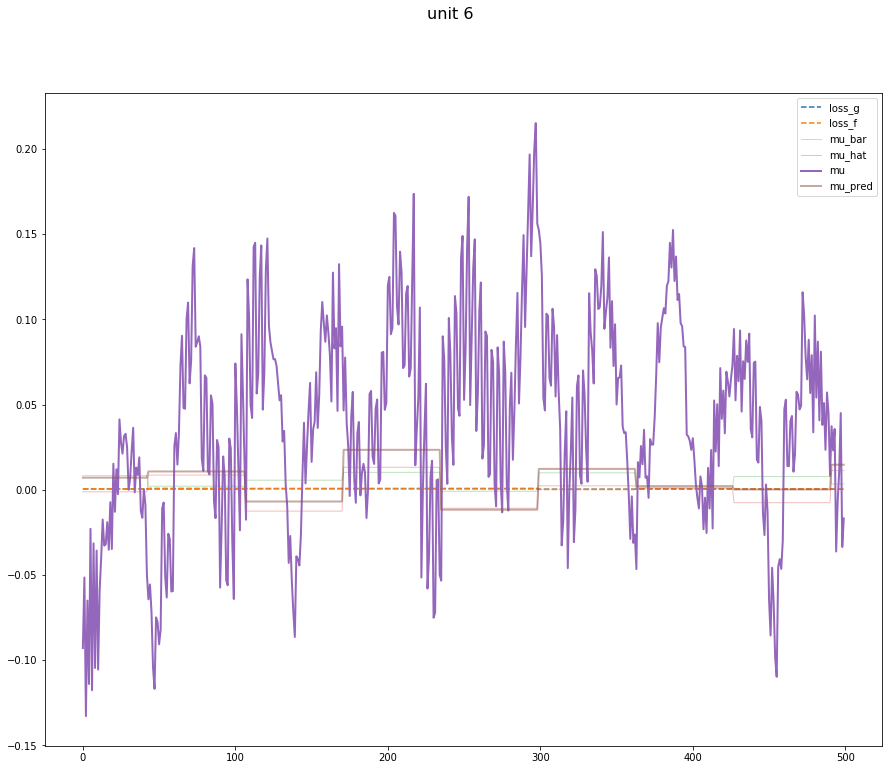

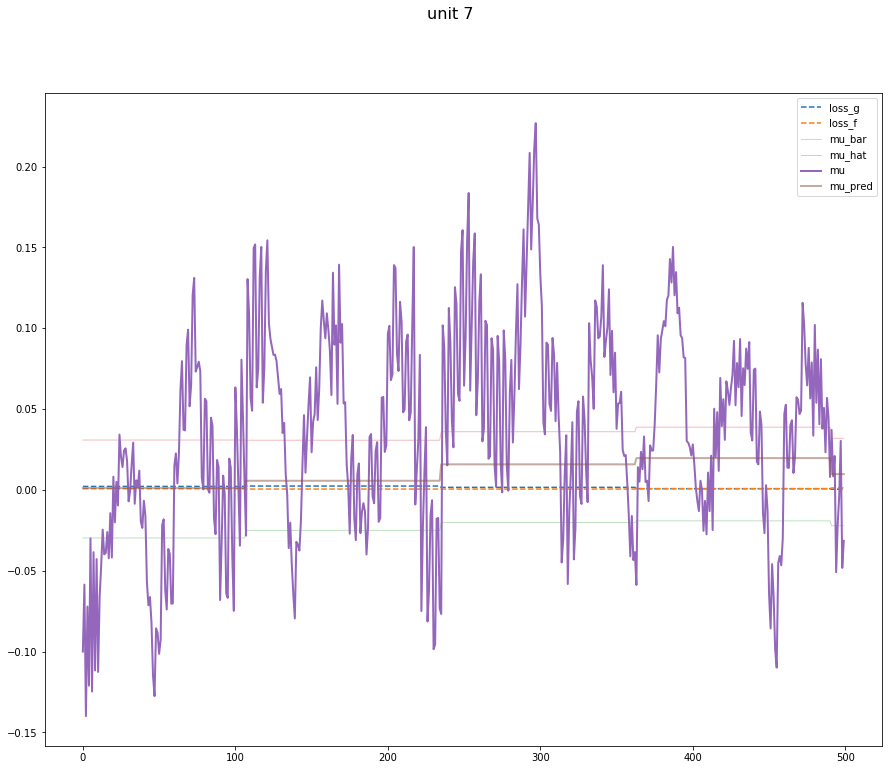

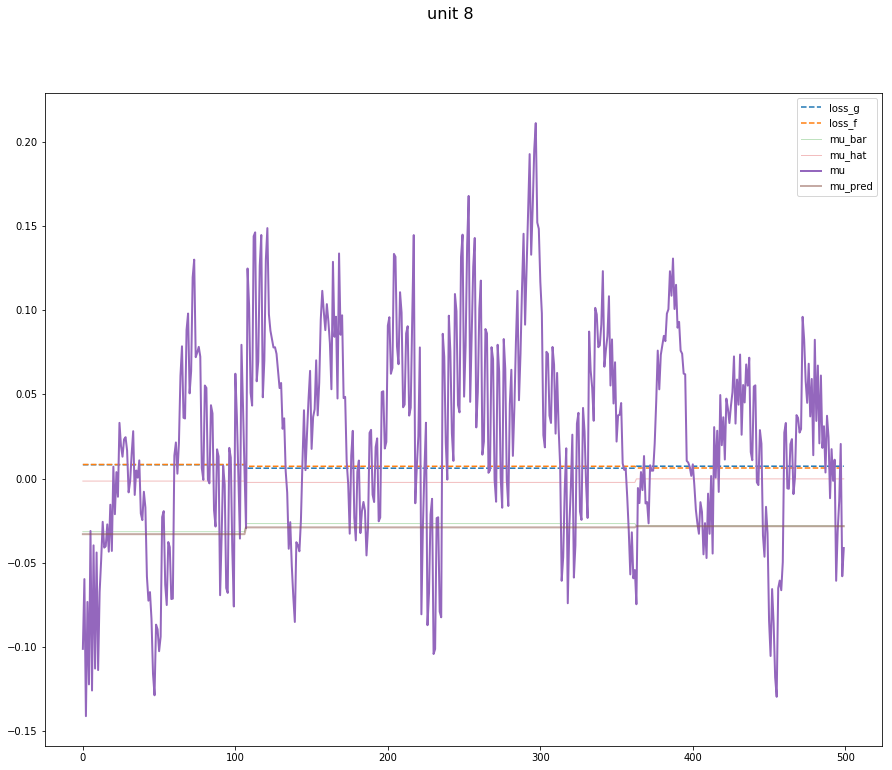

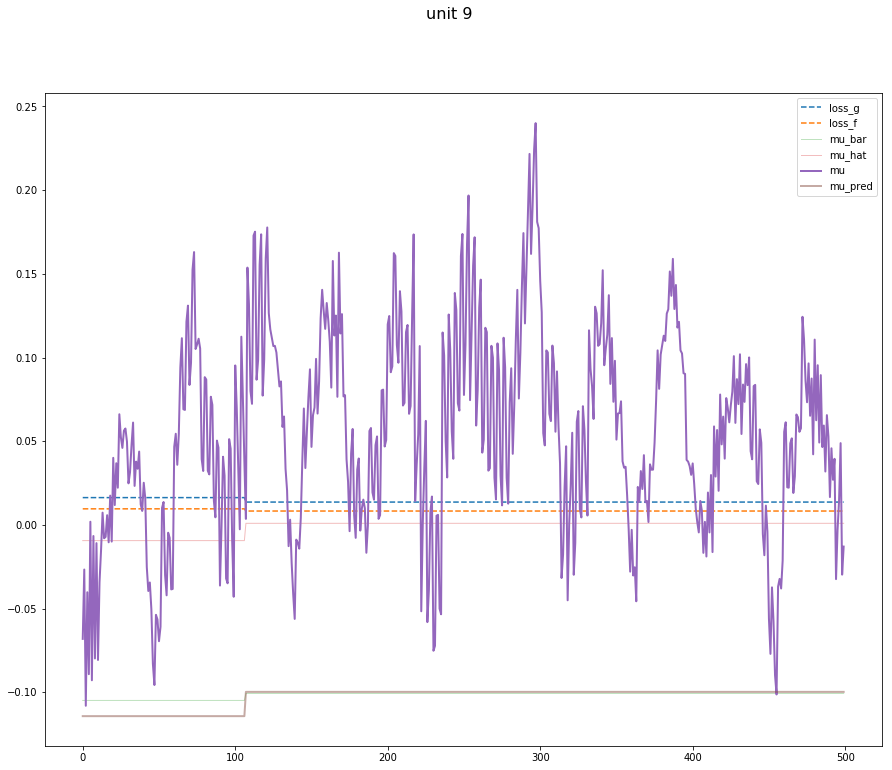

In [7]:
# TRAIN

for i in range(5000):
    mu_buffer.append_item(next(data_generator))

    mu = torch.tensor(mu_buffer.buffer).float().to(device)
    loss = network.step(mu=mu, mu_awareness=mu_awareness, train=True)
    # print(loss)

    loss_history.append(loss)
        
    if (i+1) % 500 == 0:
        [plot_history(np.array(loss_history)[:, i, :], title='unit {}'.format(i)) for i in range(unit_count)]

        loss_history = []

print("==================")

In [4]:
# TEST

# for i in range(500):
#     pred_mu = units[0].mu_hat + units[0].mu_bar
#     #pdb.set_trace()
#     mu_buffer.append_item(pred_mu.detach().tolist()[-1])

#     mu = torch.tensor(mu_buffer.buffer).float().to(device)
#     loss = network.step(mu=mu, mu_awareness=mu_awareness, train=True)
#     # print(loss)

#     loss_history.append(loss)
        
#     if (i+1) % 100 == 0:
#         [plot_history(np.array(loss_history)[:, i, :], title='unit {}'.format(i)) for i in range(unit_count)]

#         loss_history = []

### notes
- higher units need train on pooled input, but 